# Intersected Intermediate CG-Projection Enclosure for the Updated Plate System

This v4 notebook is based on `system_updated_plate_solver_v3.ipynb`. For every
$j=1,\ldots,m$, it includes the projected hull $B_j$ in the running box

$$C_j=B_0\cap B_1\cap\cdots\cap B_j.$$

Only visualization storage is decimated: the animation retains $C_{50}$,
$C_{100}$, and so on. It never substitutes the separate boxes $B_0\cap B_j$
for the cumulative intersection.

The selected direction sets are nested, linearly independent subsets of the
recorded original CG directions. Row blocking avoids materializing the full
21,570-by-21,570 projector for the whole system at once.


In [1]:
from pathlib import Path
from time import perf_counter

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
from scipy.linalg import cholesky, solve_triangular
from scipy.sparse import diags, load_npz
from scipy.sparse.linalg._isolve.utils import make_system

from system_updated_plate.cg_projection_enclosure import select_independent_directions


data_dir = Path("system_updated_plate")
A = load_npz(data_dir / "A.npz").tocsr()
b = np.loadtxt(data_dir / "b.dat", dtype=float)
x_star = np.loadtxt(data_dir / "soln_x.dat", dtype=float)
boxes = {
    "box_1": np.loadtxt(data_dir / "box_1.dat", dtype=float),
    "box_2": np.loadtxt(data_dir / "box_2.dat", dtype=float),
}

n = len(b)
if A.shape != (n, n):
    raise ValueError(f"Expected A to have shape {(n, n)}, got {A.shape}.")
for box_name, box in boxes.items():
    if box.shape != (n, 2):
        raise ValueError(f"{box_name} should have shape {(n, 2)}, got {box.shape}.")
    if np.any(box[:, 0] > box[:, 1]):
        raise ValueError(f"{box_name} has lower bounds above upper bounds.")
    if not np.all((box[:, 0] <= x_star) & (x_star <= box[:, 1])):
        raise ValueError(f"{box_name} does not contain the stored solution.")

print(f"system dimension: {n}")
print(f"matrix nonzeros: {A.nnz}")
print(f"stored solution residual: {np.linalg.norm(b - A @ x_star):.6e}")


system dimension: 21570
matrix nonzeros: 659988
stored solution residual: 5.011750e-11


## Jacobi scaling

With `scale = sqrt(diag(A))`, solve in $y=\mathrm{scale}\,x$ coordinates
and transform all reported bounds back to the original variables.


In [2]:
diagonal = A.diagonal()
if np.any(diagonal <= 0):
    raise ValueError("Jacobi scaling requires a positive diagonal.")

scale = np.sqrt(diagonal)
inverse_scale = 1.0 / scale
A_hat = diags(inverse_scale) @ A @ diags(inverse_scale)
b_hat = inverse_scale * b

cg_projection_iterations = 2200
snapshot_period = 50
projection_qr_tolerance = 1e-10
projection_max_gram_condition = 1e12
projector_row_block_size = 128
max_tracked_coordinates = 80

if not 1 <= cg_projection_iterations <= n:
    raise ValueError("The algorithm requires 1 <= m <= n.")
tracked_indices = np.unique(
    np.linspace(0, n - 1, min(n, max_tracked_coordinates)).round().astype(int)
)
print(f"tracked animation coordinates: {len(tracked_indices)}")
print(f"fixed CG iterations m: {cg_projection_iterations}")
print(f"animation snapshot period: {snapshot_period}")


tracked animation coordinates: 80
fixed CG iterations m: 2200
animation snapshot period: 50


## SciPy CG recurrence with preserved directions

The CG loop is copied from SciPy's implementation on the scaled sparse
system. It keeps $p_k$ and $\hat A p_k$ and omits only the tolerance exit,
so the algorithm receives exactly $m$ directions.


In [3]:
def scipy_cg_with_directions(A, b, x0, maxiter):
    """SciPy's unpreconditioned CG loop, with p_k and A p_k retained.

    The recurrence is copied from scipy.sparse.linalg.cg. Its tolerance exit
    is intentionally omitted because the enclosure experiment prescribes a
    fixed number of iterations. Jacobi scaling has already been applied.
    """
    A, M, x, b, postprocess = make_system(A, None, x0, b)
    n = len(b)
    if maxiter < 1:
        raise ValueError("maxiter must be positive.")

    dotprod = np.vdot if np.iscomplexobj(x) else np.dot
    matvec = A.matvec
    psolve = M.matvec
    r = b - matvec(x) if x.any() else b.copy()

    directions = np.empty((n, maxiter), dtype=x.dtype)
    applied_directions = np.empty((n, maxiter), dtype=x.dtype)
    residual_norms = np.empty(maxiter, dtype=float)

    # This is SciPy's CG recurrence. The extra assignments only retain p,
    # A p, and the residual norm for the enclosure phase.
    rho_prev, p = None, None
    for iteration in range(maxiter):
        z = psolve(r)
        rho_cur = dotprod(r, z)
        if iteration > 0:
            beta = rho_cur / rho_prev
            p *= beta
            p += z
        else:
            p = np.empty_like(r)
            p[:] = z[:]

        directions[:, iteration] = p
        q = matvec(p)
        applied_directions[:, iteration] = q
        alpha = rho_cur / dotprod(p, q)
        x += alpha * p
        r -= alpha * q
        rho_prev = rho_cur
        residual_norms[iteration] = np.linalg.norm(r)

    return {
        "x_cg": postprocess(x),
        "residual": r,
        "residual_norms": residual_norms,
        "directions": directions,
        "applied_directions": applied_directions,
    }


In [4]:
def select_nested_independent_basis(
    directions,
    applied_directions,
    qr_tolerance=1e-10,
    max_gram_condition=1e12,
):
    """Select original CG columns once and restore chronological prefix order.

    I_j consists of the selected original indices smaller than j. Thus every
    I_j is linearly independent and I_j is nested in I_{j+1}. The final set is
    exactly the stable pivoted-QR set used by v3.
    """
    selection = select_independent_directions(
        directions=directions,
        applied_directions=applied_directions,
        qr_tolerance=qr_tolerance,
        max_gram_condition=max_gram_condition,
    )
    chronological_order = np.argsort(selection["selected"])
    selected = selection["selected"][chronological_order]
    original_basis = selection["basis"][:, chronological_order]
    original_applied_basis = selection["applied_basis"][:, chronological_order]
    gram = original_basis.T @ original_applied_basis
    gram = 0.5 * (gram + gram.T)

    # Q = P L^{-T} is an invariant basis change. Its prefixes span the same
    # selected original directions and satisfy Q^T A Q = I algebraically.
    cholesky_factor = cholesky(gram, lower=True, check_finite=False)
    basis = solve_triangular(
        cholesky_factor,
        original_basis.T,
        lower=True,
        check_finite=False,
    ).T
    applied_basis = solve_triangular(
        cholesky_factor,
        original_applied_basis.T,
        lower=True,
        check_finite=False,
    ).T
    return {
        "selected": selected,
        "basis": basis,
        "applied_basis": applied_basis,
        "qr_rank": selection["qr_rank"],
        "retained_rank": selection["retained_rank"],
        "gram_condition": selection["gram_condition"],
    }


## Every-j row-block running intersection

For every $j$, define $\mathcal I_j$ as the chronologically ordered selected
original directions whose indices are smaller than $j$. These sets are nested
and linearly independent. A Cholesky basis change makes their projectors
incremental without changing the represented subspaces.

The code intersects every distinct $B_j$. If no selected direction enters at
a particular $j$, then $B_j=B_{j-1}$ and repeating the identical intersection
is correctly skipped. Histories are copied only every 50 iterations.

For scalability, the row-block code exploits that every term in
$|\Pi_j|d^0$ is nonnegative. A partial radius sum is a rigorous lower bound.
If it already proves that raw $B_j$ contains the current running interval, the
remaining terms cannot affect the intersection and are skipped. Otherwise,
more projector-column chunks are added until containment is certified or the
exact full radius has been evaluated. Thus the shortcut changes workload, not
the resulting intersection.


In [5]:
def run_intersected_projection_enclosure(
    A,
    b,
    lower,
    upper,
    iterations,
    snapshot_period,
    tracked_indices,
    qr_tolerance=1e-10,
    max_gram_condition=1e12,
    row_block_size=128,
    certification_chunk_size=2048,
    progress_label=None,
):
    """Intersect every distinct B_j and save only periodic snapshots.

    The selected sets are I_j = {selected k: k < j}. When no new selected
    direction enters at j, B_j is identical to B_{j-1}; its repeated
    intersection is a no-op.

    Radius terms are nonnegative. A partial sum is therefore a rigorous lower
    bound for the full radius. If that lower bound already proves that B_j
    contains the current running interval on a row, no omitted term can change
    the intersection. Uncertified rows acquire further column chunks until
    containment is certified or the exact full radius has been accumulated.
    """
    lower = np.asarray(lower, dtype=float)
    upper = np.asarray(upper, dtype=float)
    center = 0.5 * (lower + upper)
    initial_radius = 0.5 * (upper - lower)
    tracked_indices = np.asarray(tracked_indices, dtype=int)
    n = len(b)

    cg_run = scipy_cg_with_directions(A, b, center, iterations)
    selection = select_nested_independent_basis(
        cg_run["directions"],
        cg_run["applied_directions"],
        qr_tolerance=qr_tolerance,
        max_gram_condition=max_gram_condition,
    )
    basis = selection["basis"]
    applied_basis = selection["applied_basis"]
    selected = selection["selected"]
    center_coefficients = basis.T @ (b - A @ center)

    snapshot_iterations = np.arange(
        snapshot_period, iterations + 1, snapshot_period, dtype=int
    )
    if snapshot_iterations.size == 0 or snapshot_iterations[-1] != iterations:
        snapshot_iterations = np.append(snapshot_iterations, iterations)
    frame_iterations = np.r_[0, snapshot_iterations]
    snapshot_lookup = {int(j): frame for frame, j in enumerate(frame_iterations)}

    tracked_shape = (len(frame_iterations), len(tracked_indices))
    tracked_lower_history = np.empty(tracked_shape)
    tracked_upper_history = np.empty(tracked_shape)
    tracked_raw_lower_history = np.empty(tracked_shape)
    tracked_raw_upper_history = np.empty(tracked_shape)
    tracked_center_history = np.empty(tracked_shape)
    tracked_radius_history = np.empty(tracked_shape)
    tracked_lower_history[0] = lower[tracked_indices]
    tracked_upper_history[0] = upper[tracked_indices]
    tracked_raw_lower_history[0] = lower[tracked_indices]
    tracked_raw_upper_history[0] = upper[tracked_indices]
    tracked_center_history[0] = center[tracked_indices]
    tracked_radius_history[0] = initial_radius[tracked_indices]

    final_lower = lower.copy()
    final_upper = upper.copy()
    maximum_columns_used = 0
    started = perf_counter()

    for start in range(0, n, row_block_size):
        stop = min(n, start + row_block_size)
        rows = np.arange(start, stop)
        row_count = len(rows)
        projected_center = center[rows].copy()
        running_lower = lower[rows].copy()
        running_upper = upper[rows].copy()

        # Always include the diagonal columns plus an initial global chunk.
        initial_stop = min(certification_chunk_size, n)
        initial_columns = np.unique(np.r_[np.arange(initial_stop), rows])
        included = np.zeros(n, dtype=bool)
        included[initial_columns] = True
        initial_projector = np.zeros((row_count, len(initial_columns)))
        diagonal_positions = np.searchsorted(initial_columns, rows)
        initial_projector[np.arange(row_count), diagonal_positions] = 1.0
        projector_chunks = [[initial_columns, initial_projector]]
        next_column = initial_stop

        tracked_mask = (tracked_indices >= start) & (tracked_indices < stop)
        tracked_positions = np.flatnonzero(tracked_mask)
        local_tracked_rows = tracked_indices[tracked_mask] - start
        tracked_projector = np.zeros((len(local_tracked_rows), n))
        if len(local_tracked_rows):
            tracked_projector[
                np.arange(len(local_tracked_rows)), rows[local_tracked_rows]
            ] = 1.0

        basis_column = 0
        for j in range(1, iterations + 1):
            changed = False
            while basis_column < len(selected) and selected[basis_column] < j:
                row_factor = basis[rows, basis_column]
                for columns, projector_values in projector_chunks:
                    projector_values -= (
                        row_factor[:, None]
                        * applied_basis[columns, basis_column][None, :]
                    )
                if len(local_tracked_rows):
                    tracked_projector -= (
                        row_factor[local_tracked_rows, None]
                        * applied_basis[:, basis_column][None, :]
                    )
                projected_center += row_factor * center_coefficients[basis_column]
                basis_column += 1
                changed = True

            if changed:
                partial_radius = np.zeros(row_count)
                for columns, projector_values in projector_chunks:
                    partial_radius += np.abs(projector_values) @ initial_radius[columns]

                required_radius = np.maximum(
                    projected_center - running_lower,
                    running_upper - projected_center,
                )
                uncertified = partial_radius < required_radius

                while np.any(uncertified) and next_column < n:
                    chunk_stop = min(next_column + certification_chunk_size, n)
                    candidates = np.arange(next_column, chunk_stop)
                    columns = candidates[~included[candidates]]
                    next_column = chunk_stop
                    if columns.size == 0:
                        continue

                    projector_values = -(
                        basis[rows, :basis_column]
                        @ applied_basis[columns, :basis_column].T
                    )
                    diagonal_mask = (columns >= start) & (columns < stop)
                    if np.any(diagonal_mask):
                        column_positions = np.flatnonzero(diagonal_mask)
                        local_rows = columns[diagonal_mask] - start
                        projector_values[local_rows, column_positions] += 1.0

                    included[columns] = True
                    projector_chunks.append([columns, projector_values])
                    partial_radius += np.abs(projector_values) @ initial_radius[columns]
                    uncertified = partial_radius < required_radius

                # Only rows not certified by a radius lower bound can change.
                if np.any(uncertified):
                    raw_lower = projected_center[uncertified] - partial_radius[uncertified]
                    raw_upper = projected_center[uncertified] + partial_radius[uncertified]
                    running_lower[uncertified] = np.maximum(
                        running_lower[uncertified], raw_lower
                    )
                    running_upper[uncertified] = np.minimum(
                        running_upper[uncertified], raw_upper
                    )
                    if np.any(running_lower[uncertified] > running_upper[uncertified]):
                        raise RuntimeError(f"Running intersection became empty at j={j}.")

            if j in snapshot_lookup and tracked_positions.size:
                frame = snapshot_lookup[j]
                tracked_radius = np.abs(tracked_projector) @ initial_radius
                tracked_center = projected_center[local_tracked_rows]
                tracked_lower_history[frame, tracked_positions] = running_lower[local_tracked_rows]
                tracked_upper_history[frame, tracked_positions] = running_upper[local_tracked_rows]
                tracked_raw_lower_history[frame, tracked_positions] = tracked_center - tracked_radius
                tracked_raw_upper_history[frame, tracked_positions] = tracked_center + tracked_radius
                tracked_center_history[frame, tracked_positions] = tracked_center
                tracked_radius_history[frame, tracked_positions] = tracked_radius

        final_lower[rows] = running_lower
        final_upper[rows] = running_upper
        maximum_columns_used = max(maximum_columns_used, int(np.count_nonzero(included)))
        if progress_label and (stop == n or stop % max(row_block_size, 2048) < row_block_size):
            print(
                f"{progress_label}: all-j intersection rows {stop}/{n}; "
                f"max certification columns {maximum_columns_used} "
                f"({perf_counter() - started:.1f} s)"
            )

    active_counts = np.searchsorted(selected, snapshot_iterations, side="left")
    return {
        "ell": final_lower,
        "u": final_upper,
        "iterations": frame_iterations,
        "ell_history": tracked_lower_history,
        "u_history": tracked_upper_history,
        "raw_ell_history": tracked_raw_lower_history,
        "raw_u_history": tracked_raw_upper_history,
        "projected_center_history": tracked_center_history,
        "projected_radius_history": tracked_radius_history,
        "residual_norms": cg_run["residual_norms"],
        "x_cg": cg_run["x_cg"],
        "selected": selected,
        "retained_rank_history": np.r_[0, active_counts],
        "qr_rank": selection["qr_rank"],
        "retained_rank": selection["retained_rank"],
        "gram_condition": selection["gram_condition"],
        "maximum_certification_columns": maximum_columns_used,
    }


## Run both updated-plate enclosures


In [6]:
box_results = {}

for box_name, box in boxes.items():
    ell_hat = scale * box[:, 0]
    u_hat = scale * box[:, 1]
    result = run_intersected_projection_enclosure(
        A=A_hat,
        b=b_hat,
        lower=ell_hat,
        upper=u_hat,
        iterations=cg_projection_iterations,
        snapshot_period=snapshot_period,
        tracked_indices=tracked_indices,
        qr_tolerance=projection_qr_tolerance,
        max_gram_condition=projection_max_gram_condition,
        row_block_size=projector_row_block_size,
        certification_chunk_size=2048,
        progress_label=box_name,
    )

    result["ell_x"] = result["ell"] / scale
    result["u_x"] = result["u"] / scale
    result["ell_history_x"] = (
        result["ell_history"] / scale[tracked_indices][None, :]
    )
    result["u_history_x"] = (
        result["u_history"] / scale[tracked_indices][None, :]
    )
    result["projected_center_history_x"] = (
        result["projected_center_history"] / scale[tracked_indices][None, :]
    )
    result["projected_radius_history_x"] = (
        result["projected_radius_history"] / scale[tracked_indices][None, :]
    )
    result["raw_ell_history_x"] = (
        result["raw_ell_history"] / scale[tracked_indices][None, :]
    )
    result["raw_u_history_x"] = (
        result["raw_u_history"] / scale[tracked_indices][None, :]
    )

    initial_width = box[tracked_indices, 1] - box[tracked_indices, 0]
    width_history = result["u_history_x"] - result["ell_history_x"]
    with np.errstate(divide="ignore", invalid="ignore"):
        result["shrinkage_history"] = np.clip(
            100.0 * (1.0 - width_history / initial_width[None, :]),
            0.0,
            100.0,
        )

    result["contains_solution"] = bool(
        np.all((result["ell_x"] <= x_star) & (x_star <= result["u_x"]))
    )
    result["monotone_lower"] = bool(
        np.all(np.diff(result["ell_history_x"], axis=0) >= -1e-12)
    )
    result["monotone_upper"] = bool(
        np.all(np.diff(result["u_history_x"], axis=0) <= 1e-12)
    )
    box_results[box_name] = result

    full_initial_width = box[:, 1] - box[:, 0]
    full_final_width = result["u_x"] - result["ell_x"]
    full_shrinkage = np.clip(
        100.0 * (1.0 - full_final_width / full_initial_width), 0.0, 100.0
    )
    print(f"{box_name} CG residual after m steps: {result['residual_norms'][-1]:.6e}")
    print(f"{box_name} selected independent directions: {result['retained_rank']}")
    print(f"{box_name} final cond(G): {result['gram_condition']:.6e}")
    print(f"{box_name} final mean full-box shrinkage: {np.nanmean(full_shrinkage):.6f}%")
    print(f"{box_name} full coordinates tightened: {np.count_nonzero(full_shrinkage > 1e-10)} / {n}")
    print(f"{box_name} contains stored solution: {result['contains_solution']}")
    print(f"{box_name} running bounds are monotone: {result['monotone_lower'] and result['monotone_upper']}")


box_1: all-j intersection rows 2048/21570; max certification columns 14336 (152.4 s)


box_1: all-j intersection rows 4096/21570; max certification columns 14336 (352.2 s)


box_1: all-j intersection rows 6144/21570; max certification columns 14336 (575.0 s)


box_1: all-j intersection rows 8192/21570; max certification columns 14336 (792.4 s)


box_1: all-j intersection rows 10240/21570; max certification columns 14336 (981.9 s)


box_1: all-j intersection rows 12288/21570; max certification columns 14336 (1157.2 s)


box_1: all-j intersection rows 14336/21570; max certification columns 14336 (1371.8 s)


box_1: all-j intersection rows 16384/21570; max certification columns 14464 (1544.1 s)


box_1: all-j intersection rows 18432/21570; max certification columns 14464 (1713.9 s)


box_1: all-j intersection rows 20480/21570; max certification columns 14464 (1886.9 s)


box_1: all-j intersection rows 21570/21570; max certification columns 14464 (1974.7 s)
box_1 CG residual after m steps: 2.706293e-13
box_1 selected independent directions: 1937
box_1 final cond(G): 7.537418e+11
box_1 final mean full-box shrinkage: 0.000000%
box_1 full coordinates tightened: 0 / 21570
box_1 contains stored solution: True
box_1 running bounds are monotone: True


box_2: all-j intersection rows 2048/21570; max certification columns 14336 (151.9 s)


box_2: all-j intersection rows 4096/21570; max certification columns 14336 (341.8 s)


box_2: all-j intersection rows 6144/21570; max certification columns 14336 (587.4 s)


box_2: all-j intersection rows 8192/21570; max certification columns 14336 (824.3 s)


box_2: all-j intersection rows 10240/21570; max certification columns 14336 (1059.1 s)


box_2: all-j intersection rows 12288/21570; max certification columns 14336 (1307.8 s)


box_2: all-j intersection rows 14336/21570; max certification columns 14336 (1549.2 s)


box_2: all-j intersection rows 16384/21570; max certification columns 14464 (1758.0 s)


box_2: all-j intersection rows 18432/21570; max certification columns 14464 (1959.7 s)


box_2: all-j intersection rows 20480/21570; max certification columns 14464 (2161.9 s)


box_2: all-j intersection rows 21570/21570; max certification columns 14464 (2266.1 s)
box_2 CG residual after m steps: 5.800161e-13
box_2 selected independent directions: 1937
box_2 final cond(G): 6.307317e+11
box_2 final mean full-box shrinkage: 0.000000%
box_2 full coordinates tightened: 0 / 21570
box_2 contains stored solution: True
box_2 running bounds are monotone: True


## Running-intersection diagnostics

These plots summarize cumulative width and the numerically retained rank at
each 50-step frame. Unlike v3's per-prefix boxes, the widths here can only
decrease because every frame includes all preceding checkpoint enclosures.


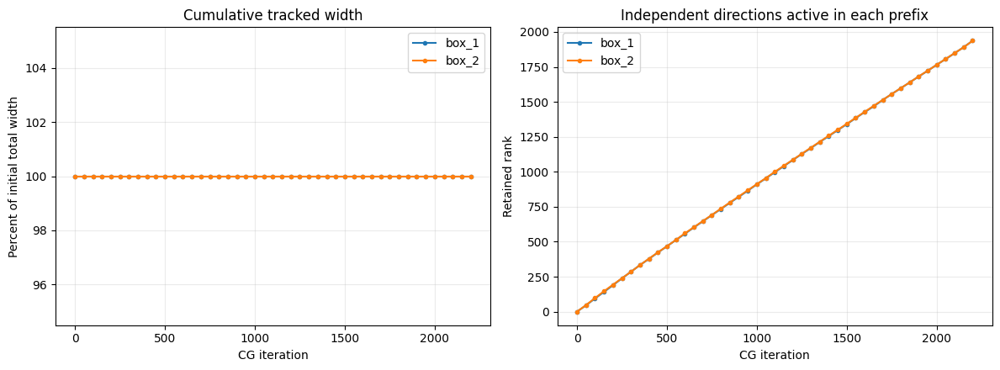

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
for box_name, result in box_results.items():
    initial_width = boxes[box_name][tracked_indices, 1] - boxes[box_name][tracked_indices, 0]
    width_history = result["u_history_x"] - result["ell_history_x"]
    total_width_pct = 100.0 * np.sum(width_history, axis=1) / np.sum(initial_width)
    axes[0].plot(result["iterations"], total_width_pct, marker="o", markersize=3, label=box_name)
    axes[1].plot(
        result["iterations"],
        result["retained_rank_history"],
        marker="o",
        markersize=3,
        label=box_name,
    )

axes[0].set(title="Cumulative tracked width", ylabel="Percent of initial total width")
axes[1].set(title="Independent directions active in each prefix", ylabel="Retained rank")
for ax in axes:
    ax.set_xlabel("CG iteration")
    ax.grid(alpha=0.25)
    ax.legend()
fig.tight_layout()
plt.show()


## Controllable animation every 50 CG steps

The animation displays 80 evenly sampled original coordinates. Frame $m$
shows $C_m=B_0\cap B_1\cap\cdots\cap B_m$. Only the stored frames are 50 steps
apart; all intervening distinct projected hulls have already been intersected.


In [8]:
def display_coordinate_contraction_animation(results, indices, title):
    frame_iterations = next(iter(results.values()))["iterations"]
    finite_values = np.concatenate([
        result["shrinkage_history"][np.isfinite(result["shrinkage_history"])]
        for result in results.values()
    ])
    y_max = max(1.0, float(np.max(finite_values)) * 1.05) if finite_values.size else 1.0

    fig, ax = plt.subplots(figsize=(9, 4.5))
    lines = {}
    for box_name, result in results.items():
        line, = ax.plot(
            indices,
            np.nan_to_num(result["shrinkage_history"][0]),
            marker="o",
            markersize=3,
            linewidth=1,
            label=box_name,
        )
        lines[box_name] = line

    label = ax.text(0.02, 0.95, "", transform=ax.transAxes, va="top")
    ax.axhline(0, color="black", linewidth=0.8)
    ax.set(xlim=(indices[0], indices[-1]), ylim=(0, y_max))
    ax.set_xlabel("Original coordinate index (evenly sampled)")
    ax.set_ylabel("Cumulative width reduction (%)")
    ax.set_title(title)
    ax.grid(alpha=0.25)
    ax.legend()

    def update(frame):
        artists = []
        for box_name, result in results.items():
            lines[box_name].set_ydata(np.nan_to_num(result["shrinkage_history"][frame]))
            artists.append(lines[box_name])
        label.set_text(f"CG iteration {frame_iterations[frame]}")
        return (*artists, label)

    animation = FuncAnimation(
        fig, update, frames=len(frame_iterations), interval=220, repeat_delay=1000
    )
    display(HTML(animation.to_jshtml(fps=5, default_mode="loop")))
    plt.close(fig)
    return animation


In [9]:
coordinate_contraction_animation = display_coordinate_contraction_animation(
    box_results,
    tracked_indices,
    "Updated plate cumulative intermediate-enclosure intersection",
)


## Raw projected bounds before the running intersection

This companion animation shows the separate raw $B_j$ bounds at the stored
iterations. These curves are diagnostic only. The main contraction animation
uses the cumulative $C_j$, not $B_0\cap B_j$.


In [10]:
def display_preintersection_bound_animation(results, initial_boxes, indices, title):
    frame_iterations = next(iter(results.values()))["iterations"][1:]
    box_names = list(results)
    fig, axes = plt.subplots(
        1, len(box_names), figsize=(7 * len(box_names), 5),
        sharex=True, squeeze=False, constrained_layout=True,
    )
    axes = axes.ravel()
    fig.suptitle(title)
    label = axes[0].text(0.02, 0.96, "", transform=axes[0].transAxes, va="top")
    artists = {}

    for ax, box_name in zip(axes, box_names):
        result = results[box_name]
        initial_lower = initial_boxes[box_name][indices, 0]
        initial_upper = initial_boxes[box_name][indices, 1]
        raw_lower = result["raw_ell_history_x"]
        raw_upper = result["raw_u_history_x"]
        ax.scatter(indices, initial_lower, s=14, facecolors="none", edgecolors="tab:blue", label="initial lower")
        ax.scatter(indices, initial_upper, s=14, facecolors="none", edgecolors="tab:orange", label="initial upper")
        lower_line, = ax.plot(indices, raw_lower[1], color="tab:blue", linewidth=0.8, label="raw projected lower")
        upper_line, = ax.plot(indices, raw_upper[1], color="tab:orange", linewidth=0.8, label="raw projected upper")
        ax.set_title(box_name)
        ax.set_xlabel("Original coordinate index (evenly sampled)")
        ax.set_ylabel("Bound value")
        ax.grid(alpha=0.25)
        ax.legend(fontsize=8, ncol=2)
        artists[box_name] = (lower_line, upper_line, raw_lower, raw_upper)

    def update(frame):
        changed = []
        history_index = frame + 1
        for box_name in box_names:
            lower_line, upper_line, raw_lower, raw_upper = artists[box_name]
            lower_line.set_ydata(raw_lower[history_index])
            upper_line.set_ydata(raw_upper[history_index])
            changed.extend([lower_line, upper_line])
        label.set_text(f"CG iteration {frame_iterations[frame]}")
        return (*changed, label)

    animation = FuncAnimation(
        fig, update, frames=len(frame_iterations), interval=300, repeat_delay=1000
    )
    display(HTML(animation.to_jshtml(fps=4, default_mode="loop")))
    plt.close(fig)
    return animation


preintersection_bound_animation = display_preintersection_bound_animation(
    box_results,
    boxes,
    tracked_indices,
    "Updated plate raw projected bounds before cumulative intersection",
)
